# Exploratory Data Analysis 


In [1]:
# Do not modify this code
!pip install -q utstd

from utstd.ipyrenders import *

In [2]:
# Do not modify this code
import warnings
warnings.simplefilter(action='ignore')

## Import packages

In [3]:
!pip install my_krml_25552249==2025.0.6.2

In [4]:
### Include below for calculating mrmr_selection
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
import pandas as pd
import numpy as np

import numpy as np
import pandas as pd
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression

def mrmr_selection(X, y, K=10, task='classification', discrete_features=None):
    """
    Select K features using mRMR (Minimum Redundancy Maximum Relevance)
    Handles both numeric and categorical features.
    
    Parameters:
        X: pd.DataFrame - feature matrix
        y: pd.Series - target variable
        K: int - number of features to select
        task: 'classification' or 'regression'
        discrete_features: list of bools - optional, indicate which columns are categorical
        
    Returns:
        selected: list of selected feature names
    """
    selected = []
    remaining = list(X.columns)
    
    # Compute relevance (MI with target)
    if task == 'classification':
        relevance = mutual_info_classif(X, y, discrete_features=discrete_features or 'auto')
    else:
        relevance = mutual_info_regression(X, y, discrete_features=discrete_features or 'auto')
    
    relevance_dict = dict(zip(X.columns, relevance))
    
    for _ in range(min(K, len(remaining))):
        if not selected:
            # Pick feature with highest relevance first
            next_feature = max(relevance_dict, key=relevance_dict.get)
        else:
            # Compute redundancy (average MI with already selected features)
            redundancy = []
            for f in remaining:
                mi_vals = []
                for s in selected:
                    # Mutual information between feature f and selected feature s
                    mi = mutual_info_classif(X[[f]], X[s], discrete_features='auto')[0] if task == 'classification' else mutual_info_regression(X[[f]], X[s], discrete_features='auto')[0]
                    mi_vals.append(mi)
                redundancy.append(np.mean(mi_vals))
            
            # Score = relevance - redundancy
            scores = np.array([relevance_dict[f] for f in remaining]) - np.array(redundancy)
            next_feature = remaining[np.argmax(scores)]
        
        selected.append(next_feature)
        remaining.remove(next_feature)
    
    return selected




# # Assume df has your features and targets
# feature_cols = [c for c in df.columns if c not in ['precipitation_sum_next_3_days', 'rain_in_7_days']]
# X = df[feature_cols]

# # Regression target
# y_reg = df['precipitation_sum_next_3_days']
# selected_reg = mrmr_selection(X, y_reg, K=10, task='regression')

# # Classification target
# y_clf = df['rain_in_7_days']
# selected_clf = mrmr_selection(X, y_clf, K=10, task='classification')

# print("Selected regression features:", selected_reg)
# print("Selected classification features:", selected_clf)

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


## Load the data

In [6]:
df = pd.read_csv("../data/raw/sydney_weather_2010_2024.csv")

In [7]:
df.head(5)

,date,weather_code,temperature_2m_mean,temperature_2m_max,temperature_2m_min,apparent_temperature_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,...,surface_pressure_max,surface_pressure_min,winddirection_10m_dominant,wind_gusts_10m_mean,wind_speed_10m_mean,wind_gusts_10m_min,wind_speed_10m_min,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,wet_bulb_temperature_2m_min
0,2009-12-31 14:00:00+00:00,53.0,22.964250,25.670502,21.070500,25.151611,26.715890,24.240880,3.9,3.9,...,1008.16705,1003.63450,331.647500,21.330000,10.419551,7.200000,4.072935,20.643309,21.304327,19.931772
1,2010-01-01 14:00:00+00:00,63.0,23.612165,26.920502,20.970500,26.942467,32.614998,22.179842,8.6,8.6,...,1005.03217,998.06805,298.610300,26.010002,8.355687,15.119999,1.297998,21.520597,23.316803,19.692732
2,2010-01-02 14:00:00+00:00,51.0,19.882996,20.620499,19.470500,19.709002,21.280840,19.180962,1.1,1.1,...,1013.45440,1005.12430,146.744640,28.275000,12.964748,12.959999,6.915374,16.673801,19.032654,15.879213
3,2010-01-03 14:00:00+00:00,51.0,20.887167,22.520500,19.220500,21.016272,22.343325,19.466248,0.6,0.6,...,1014.66760,1011.22390,69.884770,23.565000,11.067534,11.159999,5.623380,17.092829,17.960950,15.985977
4,2010-01-04 14:00:00+00:00,3.0,22.520498,26.020500,18.620499,24.393919,30.018890,19.811030,0.0,0.0,...,1012.26750,1007.10223,35.137077,24.285002,9.724721,10.080000,4.334974,19.079020,21.130150,16.724476


In [8]:
df.tail(8)

,date,weather_code,temperature_2m_mean,temperature_2m_max,temperature_2m_min,apparent_temperature_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,...,surface_pressure_max,surface_pressure_min,winddirection_10m_dominant,wind_gusts_10m_mean,wind_speed_10m_mean,wind_gusts_10m_min,wind_speed_10m_min,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,wet_bulb_temperature_2m_min
5471,2024-12-23 14:00:00+00:00,3.0,19.808332,22.537500,15.837500,18.109450,21.842976,13.074228,0.0,0.0,...,1009.65674,1001.67535,184.936940,32.339996,12.891021,11.879999,5.983477,13.132172,15.567741,9.885325
5472,2024-12-24 14:00:00+00:00,0.0,21.368750,27.187500,16.137499,21.868284,29.327011,15.918610,0.0,0.0,...,1011.69995,1008.27783,57.746136,27.209997,9.999595,5.760000,1.988165,16.614202,18.699326,13.557238
5473,2024-12-25 14:00:00+00:00,3.0,22.552084,27.037500,16.837500,23.462067,29.112705,18.266445,0.0,0.0,...,1010.25720,1001.18250,37.269980,37.109997,15.707917,5.400000,2.052316,19.040123,20.722878,16.713879
5474,2024-12-26 14:00:00+00:00,53.0,26.202085,35.187500,20.887499,26.242342,37.215233,20.495504,0.8,0.8,...,1001.35250,994.86365,339.781250,41.295000,16.679815,22.680000,8.211235,19.730782,22.680115,17.356268
5475,2024-12-27 14:00:00+00:00,51.0,21.352081,24.037500,18.587500,21.829940,25.389044,19.079412,0.9,0.9,...,1005.42200,1001.24490,109.408130,31.574997,12.241256,15.480000,7.486788,17.523623,18.228878,16.697666
5476,2024-12-28 14:00:00+00:00,1.0,22.214584,27.887499,16.937500,22.691307,28.141224,18.093904,0.0,0.0,...,1012.48310,1004.95560,136.802410,27.345001,10.361734,7.200000,3.054701,17.012634,18.846426,15.039368
5477,2024-12-29 14:00:00+00:00,51.0,22.462500,25.587500,19.737500,23.395332,27.735592,20.556278,0.3,0.3,...,1014.50604,1009.16470,84.956360,31.214998,12.572087,19.800000,8.936778,18.610620,19.632471,17.276335
5478,2024-12-30 14:00:00+00:00,3.0,22.993752,26.487500,18.737500,24.854470,28.978016,21.394054,0.0,0.0,...,1009.80255,1007.22280,65.856026,25.004995,9.582100,2.880000,1.310420,19.490635,20.240698,18.014656


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5479 entries, 0 to 5478
Data columns (total 45 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   date                          5479 non-null   object 
 1   weather_code                  5479 non-null   float64
 2   temperature_2m_mean           5479 non-null   float64
 3   temperature_2m_max            5479 non-null   float64
 4   temperature_2m_min            5479 non-null   float64
 5   apparent_temperature_mean     5479 non-null   float64
 6   apparent_temperature_max      5479 non-null   float64
 7   apparent_temperature_min      5479 non-null   float64
 8   precipitation_sum             5479 non-null   float64
 9   rain_sum                      5479 non-null   float64
 10  snowfall_sum                  5479 non-null   float64
 11  precipitation_hours           5479 non-null   float64
 12  wind_speed_10m_max            5479 non-null   float64
 13  win

In [10]:
# Ensure 'date' is datetime
df['date'] = pd.to_datetime(df['date'])

# Sort by date just in case
df = df.sort_values('date').reset_index(drop=True)

# Binary target: rain in next 7 days
# Rain exactly in 7 days (binary)
df['rain_in_7_days'] = (df['precipitation_sum'].shift(-7) > 0).astype(int)

# Force last 7 rows to NaN because we don’t have 7 future days
df.loc[df.index[-7]:, 'rain_in_7_days'] = float('nan')

# Regression target: sum of precipitation next 3 days
df['precipitation_sum_next_3_days'] = df['precipitation_sum'].shift(-1) + \
                                  df['precipitation_sum'].shift(-2) + \
                                  df['precipitation_sum'].shift(-3)


In [11]:
df[['date','rain_in_7_days','precipitation_sum_next_3_days']].tail(8)

,date,rain_in_7_days,precipitation_sum_next_3_days
5471,2024-12-23 14:00:00+00:00,0.0,0.8
5472,2024-12-24 14:00:00+00:00,NaN,1.7
5473,2024-12-25 14:00:00+00:00,NaN,1.7
5474,2024-12-26 14:00:00+00:00,NaN,1.2
5475,2024-12-27 14:00:00+00:00,NaN,0.3
5476,2024-12-28 14:00:00+00:00,NaN,NaN
5477,2024-12-29 14:00:00+00:00,NaN,NaN
5478,2024-12-30 14:00:00+00:00,NaN,NaN


Save each of the data separately for rain in 7 days and precipitaiton sum next 3 days

In [197]:
# df_class = df.copy()
# df_reg = df.copy()

# # For classification: drop last 7 rows
# df_class = df_class.iloc[:-7].reset_index(drop=True)
# df_class.drop(['precipitation_sum_next_3_days'], axis=1, inplace=True)

# # For regression: drop last 3 rows
# df_reg = df_reg.iloc[:-3].reset_index(drop=True)
# df_reg.drop(['rain_in_7_days'], axis=1, inplace=True)

# # Save datasets
# df_class.to_csv("../data/raw/sydney_weather_2010_2024_classification.csv", index=False)
# df_reg.to_csv("../data/raw/sydney_weather_2010_2024_regression.csv", index=False)



Sunrise and sunset are the date and exact time when they occurred. - can feature engineer this

Also, weather_code should be categorical and not numerical. Have to either label encode or onehot encode if wanting to use this variable. Have to link weather code to the weather condition.

In [12]:
# get rid of 2009 date
# Keep only rows where year is not 2009
df = df[df['date'].dt.year != 2009]

In [13]:
df.weather_code.value_counts(ascending=False)

weather_code
3.0     1614
51.0    1362
53.0     554
61.0     402
2.0      373
1.0      328
63.0     321
0.0      292
55.0     187
65.0      45
Name: count, dtype: int64

In [14]:
# Mapping dictionary from code to description
weather_map = {
    0: "Sunny",
    1: "Mainly Sunny",
    2: "Partly Cloudy",
    3: "Cloudy",
    51: "Light Drizzle",
    53: "Drizzle",
    55: "Heavy Drizzle",
    61: "Light Rain",
    63: "Rain",
    65: "Heavy Rain"
}

# Add a new column with descriptions
df["weather_desc"] = df["weather_code"].map(weather_map)

In [15]:
df['weather_desc'].value_counts()

weather_desc
Cloudy           1614
Light Drizzle    1362
Drizzle           554
Light Rain        402
Partly Cloudy     373
Mainly Sunny      328
Rain              321
Sunny             292
Heavy Drizzle     187
Heavy Rain         45
Name: count, dtype: int64

Exploring numerical features

In [16]:
df.describe()

,weather_code,temperature_2m_mean,temperature_2m_max,temperature_2m_min,apparent_temperature_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,...,winddirection_10m_dominant,wind_gusts_10m_mean,wind_speed_10m_mean,wind_gusts_10m_min,wind_speed_10m_min,wet_bulb_temperature_2m_mean,wet_bulb_temperature_2m_max,wet_bulb_temperature_2m_min,rain_in_7_days,precipitation_sum_next_3_days
count,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.0,...,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5478.000000,5471.000000,5475.000000
mean,29.699708,17.531641,21.491945,13.918521,16.854930,21.359697,13.013572,2.424608,2.424608,0.0,...,180.629414,25.833206,11.930193,12.108433,5.235005,14.198019,16.151170,12.032783,0.524036,7.272530
std,26.370733,4.203136,4.560701,4.511792,5.831524,6.445562,6.116412,6.730952,6.730952,0.0,...,103.361595,8.798802,4.589165,6.513607,3.625155,4.271426,4.055297,4.662860,0.499468,14.806577
min,0.000000,7.439583,9.787499,0.937500,3.497893,6.370839,-2.973838,0.000000,0.000000,0.0,...,0.100737,8.579999,3.419965,1.440000,0.000000,3.809179,6.469021,-0.378638,0.000000,0.000000
25%,3.000000,13.964334,17.887499,10.270500,12.024611,16.221031,7.971886,0.000000,0.000000,0.0,...,82.988071,19.394999,8.544647,7.920000,2.620839,10.710197,12.836336,8.180997,0.000000,0.100000
50%,51.000000,17.626042,21.329000,13.937500,16.775750,21.031617,12.865790,0.100000,0.100000,0.0,...,182.697625,24.269997,10.986866,10.440001,4.510787,14.193471,16.121676,12.013544,1.000000,1.800000
75%,53.000000,20.949999,24.520500,17.820500,21.565726,26.024167,18.121816,1.600000,1.600000,0.0,...,272.015013,30.836246,14.487701,14.400000,6.821006,17.752553,19.363373,15.962743,1.000000,7.500000
max,65.000000,30.516668,41.837500,26.887499,32.557170,45.181960,28.333252,138.400010,138.400010,0.0,...,359.857450,76.215004,37.387234,60.120003,29.620802,24.301146,28.387917,22.752897,1.000000,203.700007


In [17]:
df['snowfall_sum'].value_counts()

snowfall_sum
0.0    5478
Name: count, dtype: int64

Drop snowfall_sum column

In [18]:
df = df.drop(columns=['snowfall_sum'], axis=1)

Pattern of target variable over the years

Precipitation

Classification

In [21]:
# Count of each class
print(df['rain_in_7_days'].value_counts())

# Proportion of each class
print(df['rain_in_7_days'].value_counts(normalize=True))

rain_in_7_days
1.0    2867
0.0    2604
Name: count, dtype: int64
rain_in_7_days
1.0    0.524036
0.0    0.475964
Name: proportion, dtype: float64


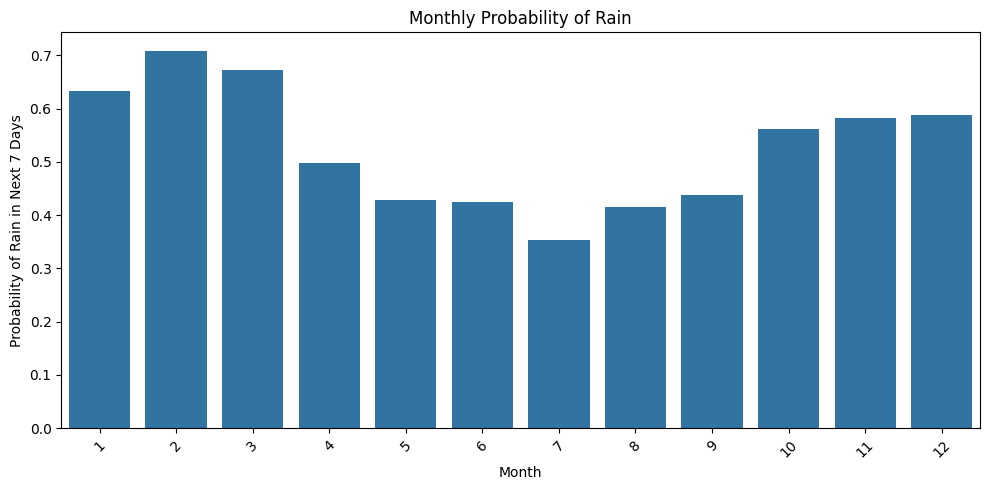

In [22]:
# Compute monthly probability
df['month'] = df['date'].dt.month
monthly_rain = df.groupby('month')['rain_in_7_days'].mean().reset_index()

plt.figure(figsize=(10,5))
sns.barplot(data=monthly_rain, x='month', y='rain_in_7_days')

plt.xlabel('Month')
plt.ylabel('Probability of Rain in Next 7 Days')
plt.title('Monthly Probability of Rain')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

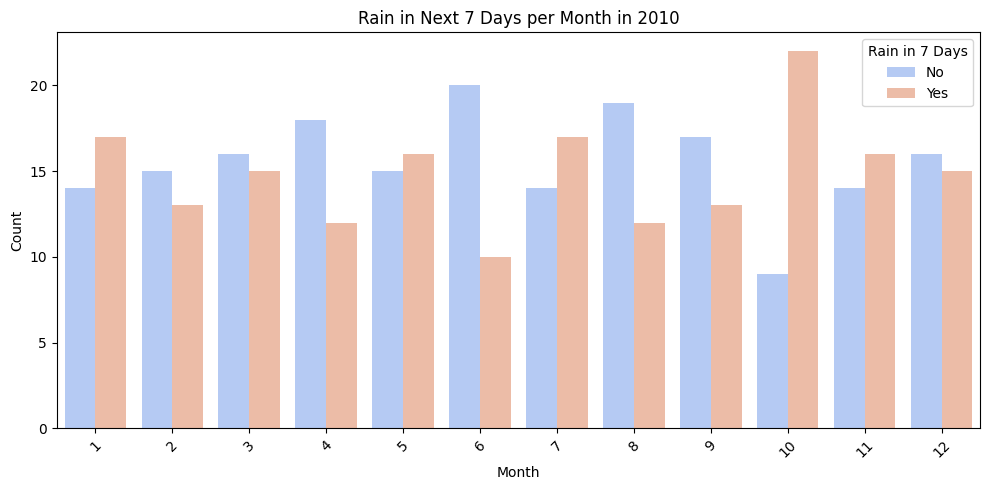

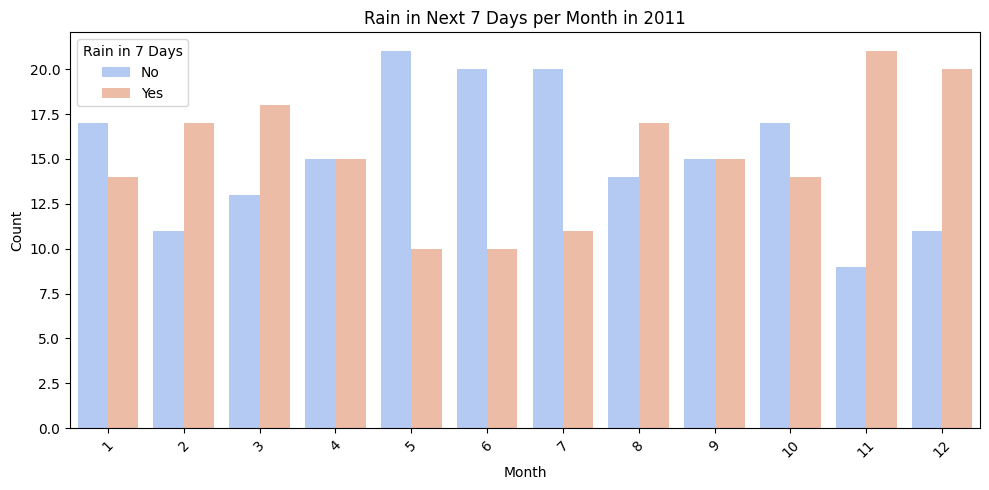

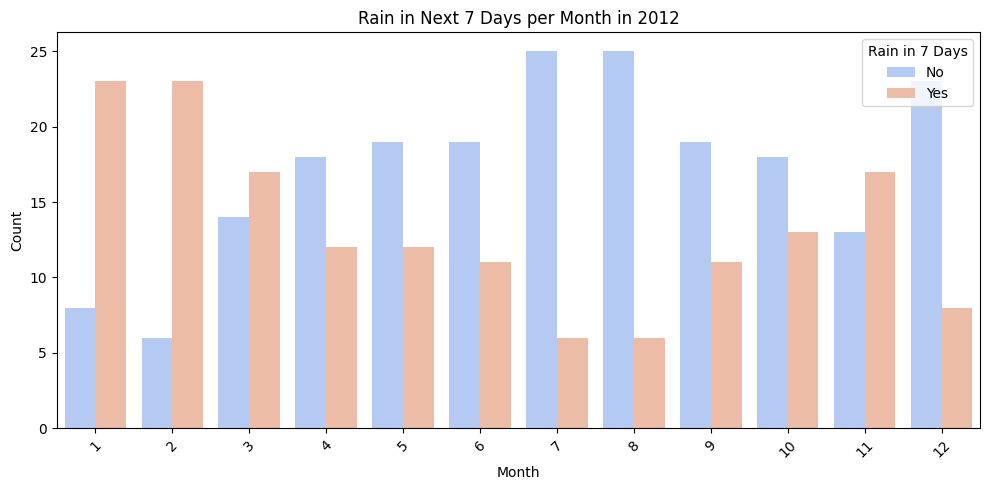

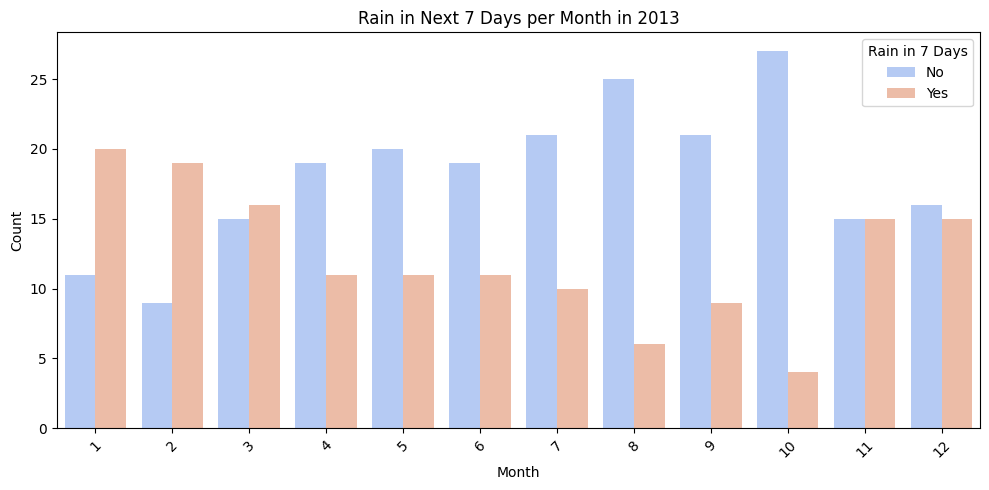

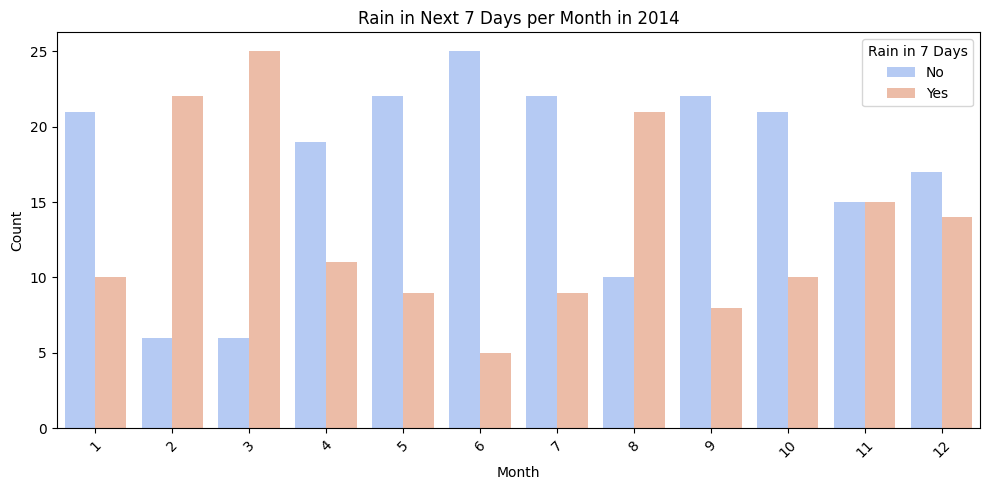

...

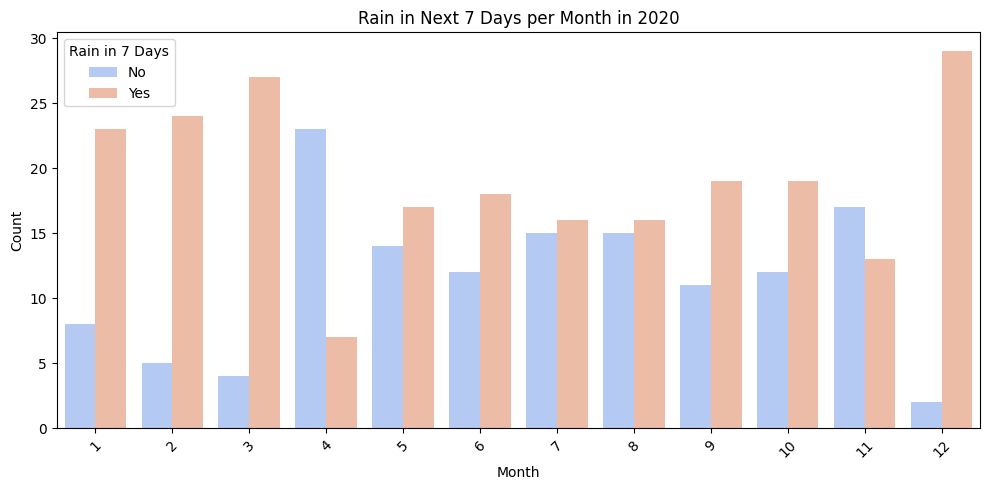

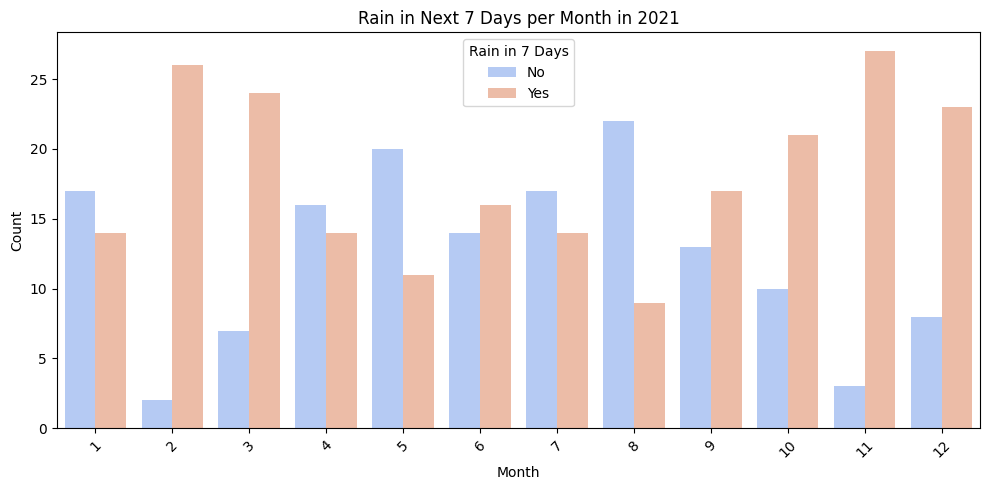

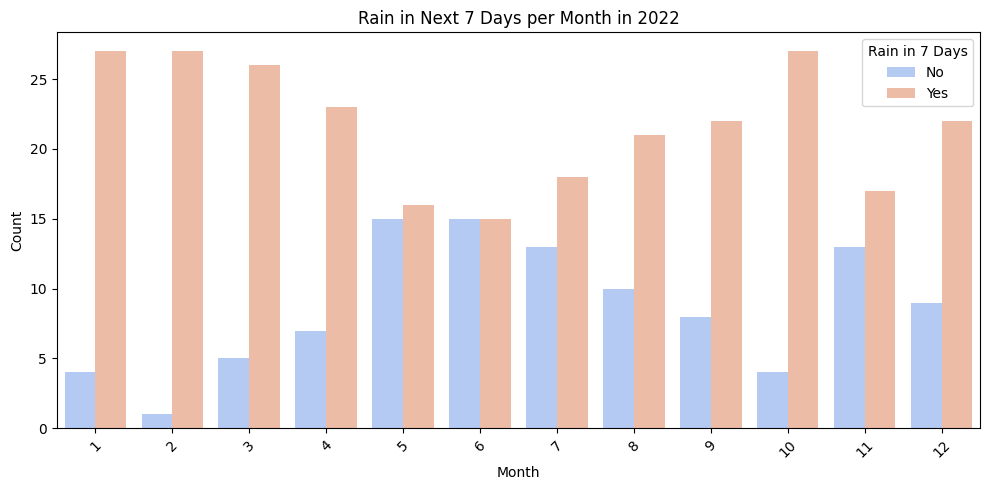

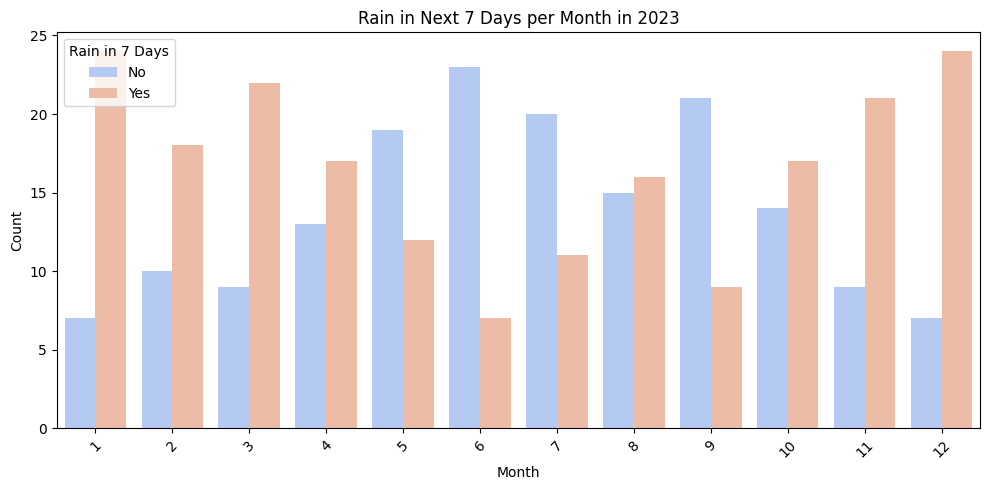

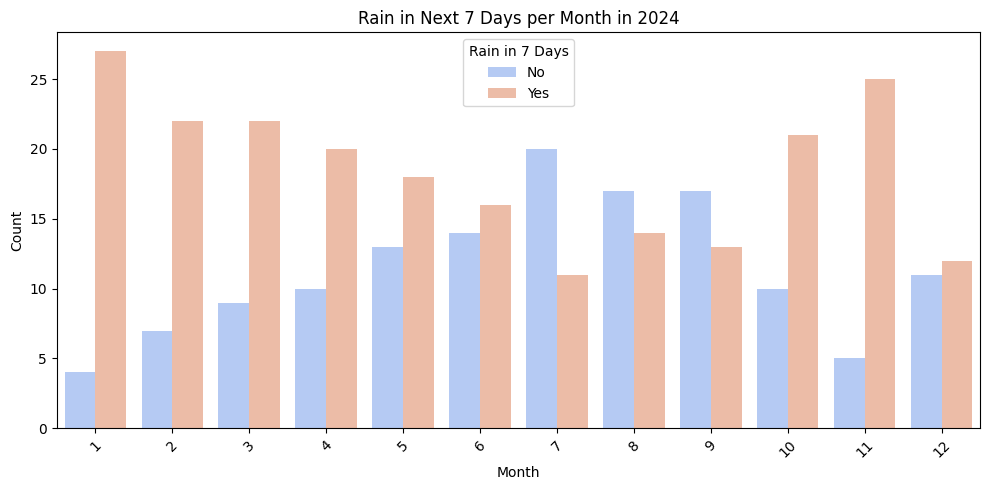

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure 'date' is datetime
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].dt.month

for year in years:
    df_year = df[df['date'].dt.year == year]
    
    # Count of rain/non-rain per month
    monthly_counts = df_year.groupby(['month', 'rain_in_7_days']).size().reset_index(name='count')
    
    plt.figure(figsize=(10,5))
    ax = sns.barplot(data=monthly_counts, x='month', y='count', hue='rain_in_7_days', palette='coolwarm')
    
    plt.title(f'Rain in Next 7 Days per Month in {year}')
    plt.xlabel('Month')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    
    # Fix legend labels
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles, ['No', 'Yes'], title='Rain in 7 Days')
    
    plt.tight_layout()
    plt.show()

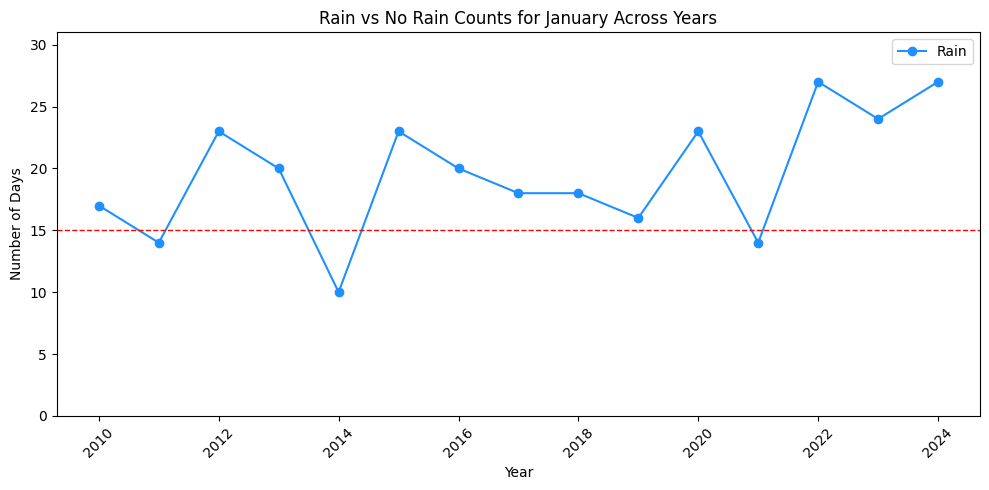

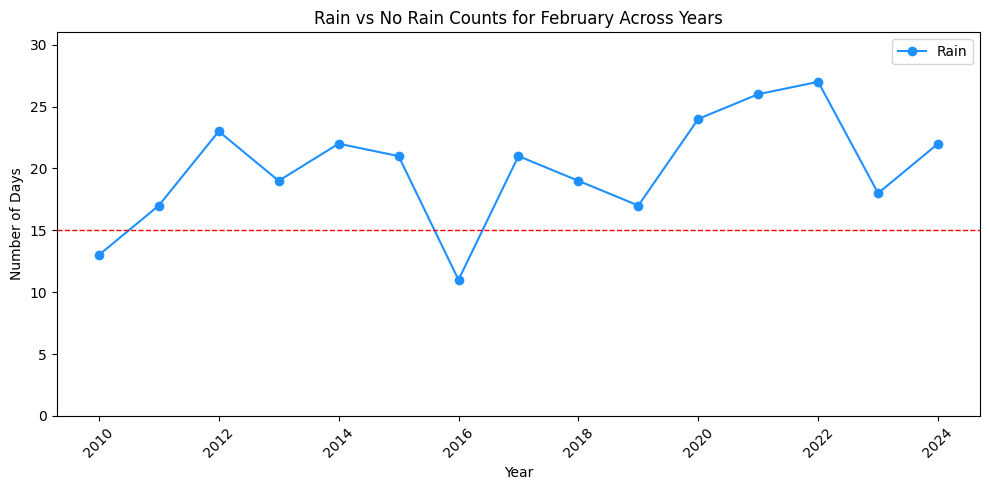

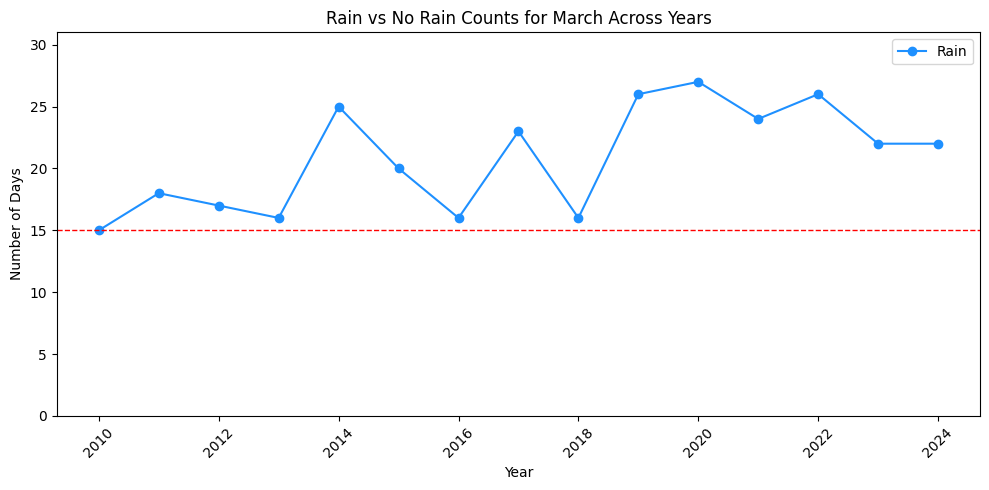

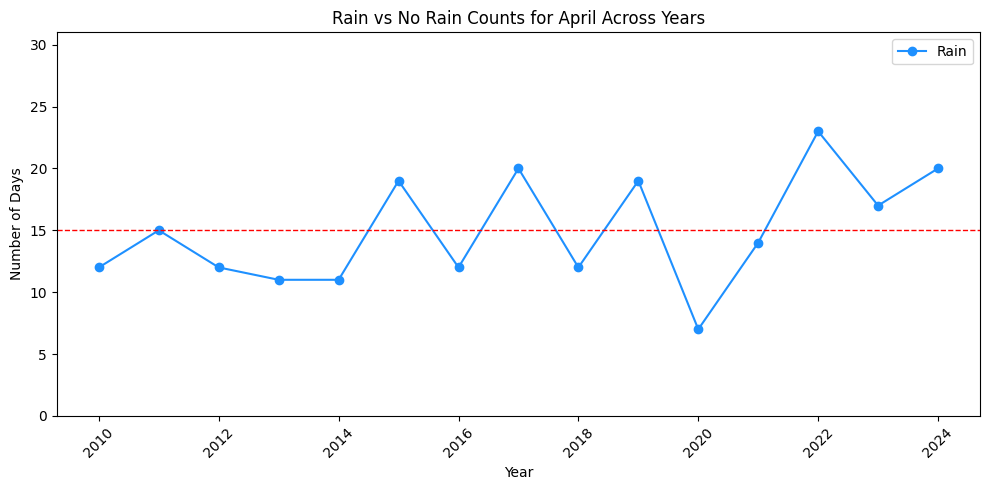

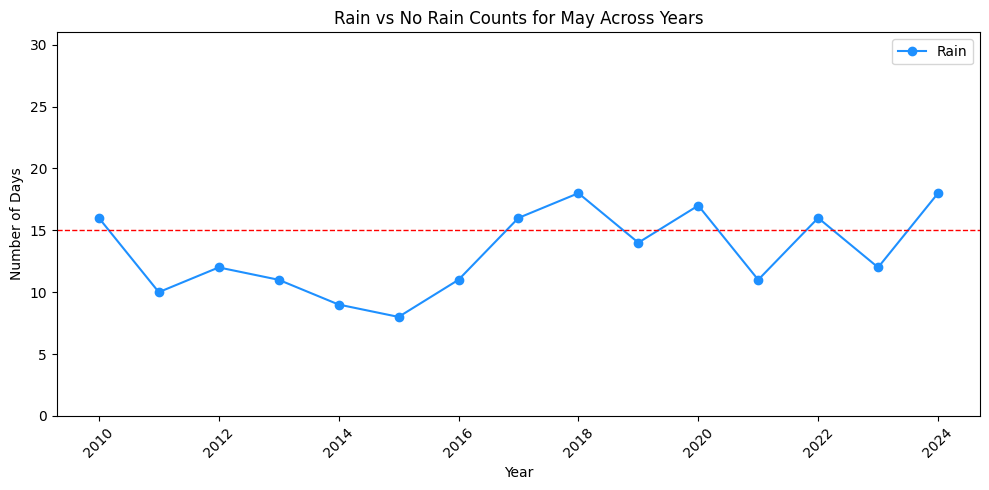

...

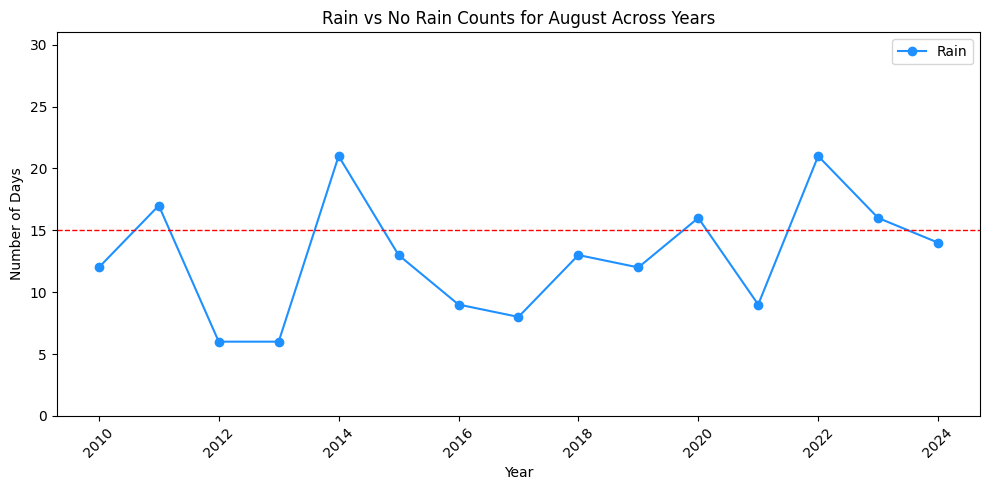

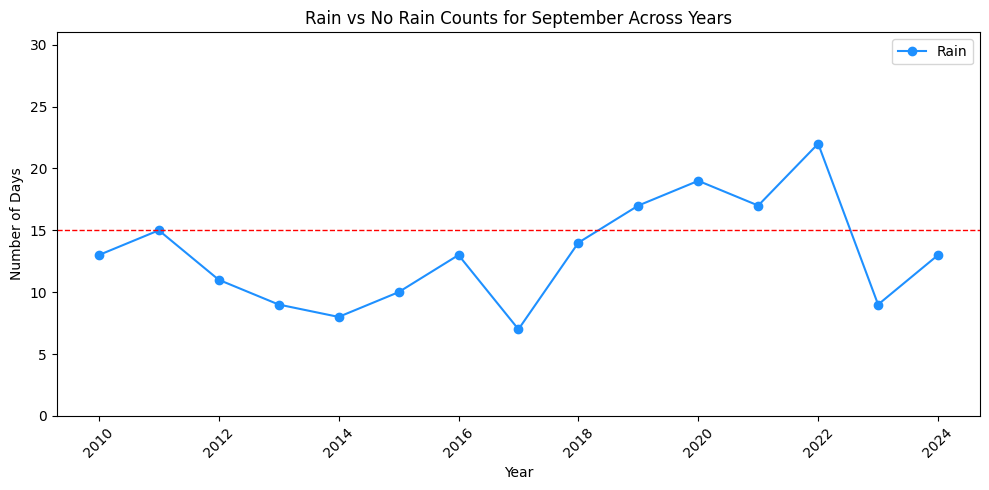

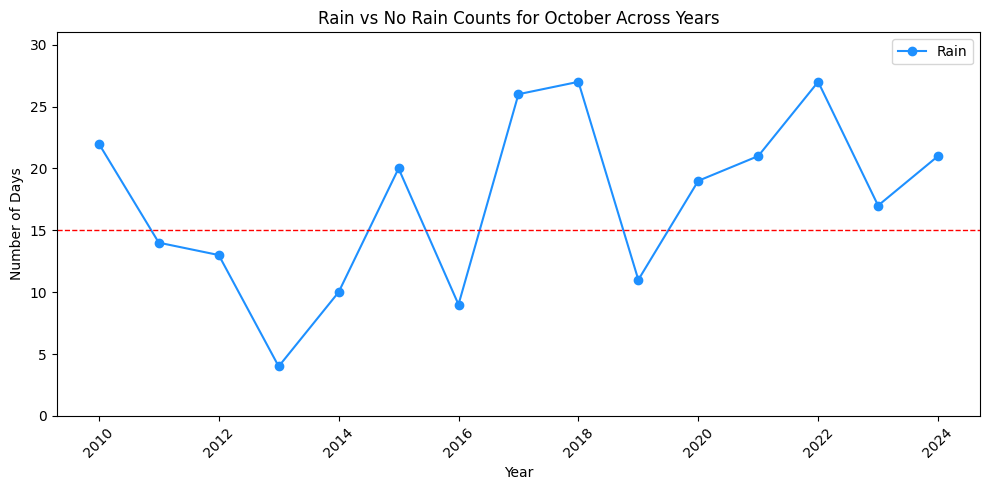

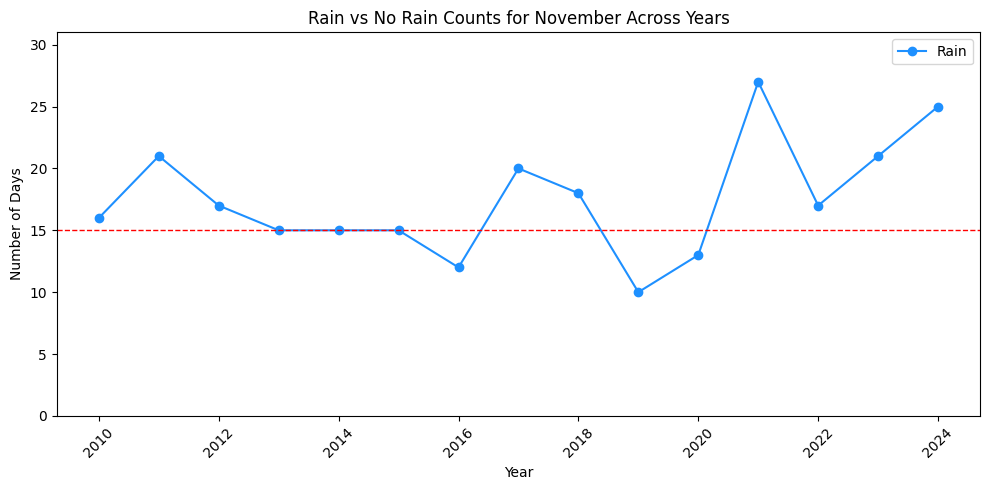

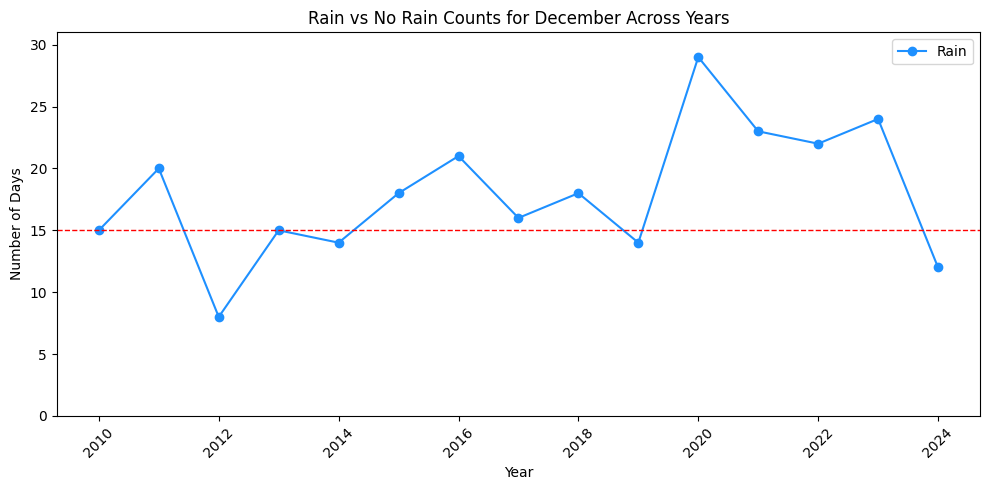

In [24]:
import matplotlib.pyplot as plt
import pandas as pd
import calendar

# Ensure date and extract month and year
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Loop through months
for month_num in range(1, 13):
    df_month = df[df['month'] == month_num]
    
    # Count of rain/no rain per year
    yearly_counts = df_month.groupby(['year', 'rain_in_7_days']).size().reset_index(name='count')
    
    # Pivot so rain/no rain are columns
    pivot_counts = yearly_counts.pivot(index='year', columns='rain_in_7_days', values='count').fillna(0)
    
    plt.figure(figsize=(10,5))
    # Rain = blue
    plt.plot(pivot_counts.index, pivot_counts.get(1, 0), marker='o', color='dodgerblue', label='Rain')
    
    plt.axhline(15, color='red', linestyle='--', linewidth=1)

    plt.title(f'Rain vs No Rain Counts for {calendar.month_name[month_num]} Across Years')
    plt.xlabel('Year')
    plt.ylabel('Number of Days')
    plt.ylim(0, 31)
    plt.xticks(rotation=45)
    plt.legend()    
    plt.tight_layout()
    plt.show()


Adding time features

In [25]:
# Ensure 'date' is datetime
df['date'] = pd.to_datetime(df['date'])

# Basic time features
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['day_of_week'] = df['date'].dt.dayofweek  # Monday=0, Sunday=6
df['week_of_year'] = df['date'].dt.isocalendar().week.astype(int)
df['quarter'] = df['date'].dt.quarter

# cyclical features
import numpy as np

# Encode month as sine/cosine
df['month_sin'] = np.sin(2 * np.pi * df['month']/12)
df['month_cos'] = np.cos(2 * np.pi * df['month']/12)

# Encode day of week as sine/cosine
df['dow_sin'] = np.sin(2 * np.pi * df['day_of_week']/7)
df['dow_cos'] = np.cos(2 * np.pi * df['day_of_week']/7)


In [26]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [34]:
# ---------------------------
# 1. Correlation filtering
# ---------------------------
def correlation_filter(df, threshold=0.95):
    corr_matrix = df.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return df.drop(columns=to_drop), to_drop

# ---------------------------
# 2. VIF filtering
# ---------------------------
def vif_filter(df, thresh=10.0):
    variables = list(df.columns)
    dropped = []
    while True:
        vif = pd.Series(
            [variance_inflation_factor(df[variables].values, i) 
             for i in range(len(variables))],
            index=variables
        )
        max_vif = vif.max()
        if max_vif > thresh:
            drop_var = vif.idxmax()
            variables.remove(drop_var)
            dropped.append(drop_var)
        else:
            break
    return df[variables], dropped

In [51]:
# ---------------------------
# Example: apply to your data
# ---------------------------

# Select numerical columns
numerical_cols = df.select_dtypes(include=[np.number]).columns

# Exclude the two target columns
feature_cols = [col for col in numerical_cols if col not in ['precipitation_sum_next_3_days', 'rain_in_7_days']]

X = df.copy()
X = X[feature_cols]

# Step 1: correlation filtering
X_corr, dropped_corr = correlation_filter(X, threshold=0.90)
print("Dropped by correlation:", dropped_corr)

# Step 2: VIF filtering
X_vif, dropped_vif = vif_filter(X_corr, thresh=10.0)
print("Dropped by VIF:", dropped_vif)

Dropped by correlation: ['temperature_2m_max', 'temperature_2m_min', 'apparent_temperature_mean', 'apparent_temperature_max', 'apparent_temperature_min', 'rain_sum', 'wind_gusts_10m_max', 'et0_fao_evapotranspiration', 'sunset', 'dew_point_2m_mean', 'dew_point_2m_max', 'dew_point_2m_min', 'pressure_msl_max', 'pressure_msl_min', 'surface_pressure_mean', 'surface_pressure_max', 'surface_pressure_min', 'winddirection_10m_dominant', 'wind_speed_10m_mean', 'wind_speed_10m_min', 'wet_bulb_temperature_2m_mean', 'wet_bulb_temperature_2m_max', 'wet_bulb_temperature_2m_min', 'year', 'week_of_year', 'quarter', 'month_cos']
Dropped by VIF: ['relative_humidity_2m_mean', 'pressure_msl_mean', 'daylight_duration', 'relative_humidity_2m_max', 'temperature_2m_mean', 'wind_gusts_10m_mean', 'sunrise', 'sunshine_duration', 'relative_humidity_2m_min', 'cloud_cover_max', 'wind_speed_10m_max', 'shortwave_radiation_sum']


In [52]:
X_vif.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5478 entries, 1 to 5478
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   weather_code                 5478 non-null   float64
 1   precipitation_sum            5478 non-null   float64
 2   precipitation_hours          5478 non-null   float64
 3   wind_direction_10m_dominant  5478 non-null   float64
 4   vapour_pressure_deficit_max  5478 non-null   float64
 5   cloud_cover_mean             5478 non-null   float64
 6   cloud_cover_min              5478 non-null   float64
 7   wind_gusts_10m_min           5478 non-null   float64
 8   month                        5478 non-null   int32  
 9   day                          5478 non-null   int32  
 10  day_of_week                  5478 non-null   int32  
 11  month_sin                    5478 non-null   float64
 12  dow_sin                      5478 non-null   float64
 13  dow_cos                

In [54]:
X_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5478 entries, 1 to 5478
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   weather_code                 5478 non-null   float64
 1   temperature_2m_mean          5478 non-null   float64
 2   precipitation_sum            5478 non-null   float64
 3   precipitation_hours          5478 non-null   float64
 4   wind_speed_10m_max           5478 non-null   float64
 5   shortwave_radiation_sum      5478 non-null   float64
 6   wind_direction_10m_dominant  5478 non-null   float64
 7   sunrise                      5478 non-null   int64  
 8   daylight_duration            5478 non-null   float64
 9   sunshine_duration            5478 non-null   float64
 10  vapour_pressure_deficit_max  5478 non-null   float64
 11  cloud_cover_mean             5478 non-null   float64
 12  cloud_cover_max              5478 non-null   float64
 13  cloud_cover_min        

In [58]:
import matplotlib.dates as mdates
df['time'] = pd.to_datetime(df['time'])

fig, ax = plt.subplots(figsize=(16,8))

# Plot with small dots
ax.plot(df['time'], df['precipitation_sum_next_3_days'], '.', ms=8)

# Set x-axis to show every year
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Rotate labels if needed
plt.xticks(rotation=45)

plt.xlabel("Year")
plt.ylabel("Precipitation (Next 3 Days)")
plt.title("Precipitation Next 3 Days Over Time")
plt.show()

KeyError: 'time'

Correlation plot

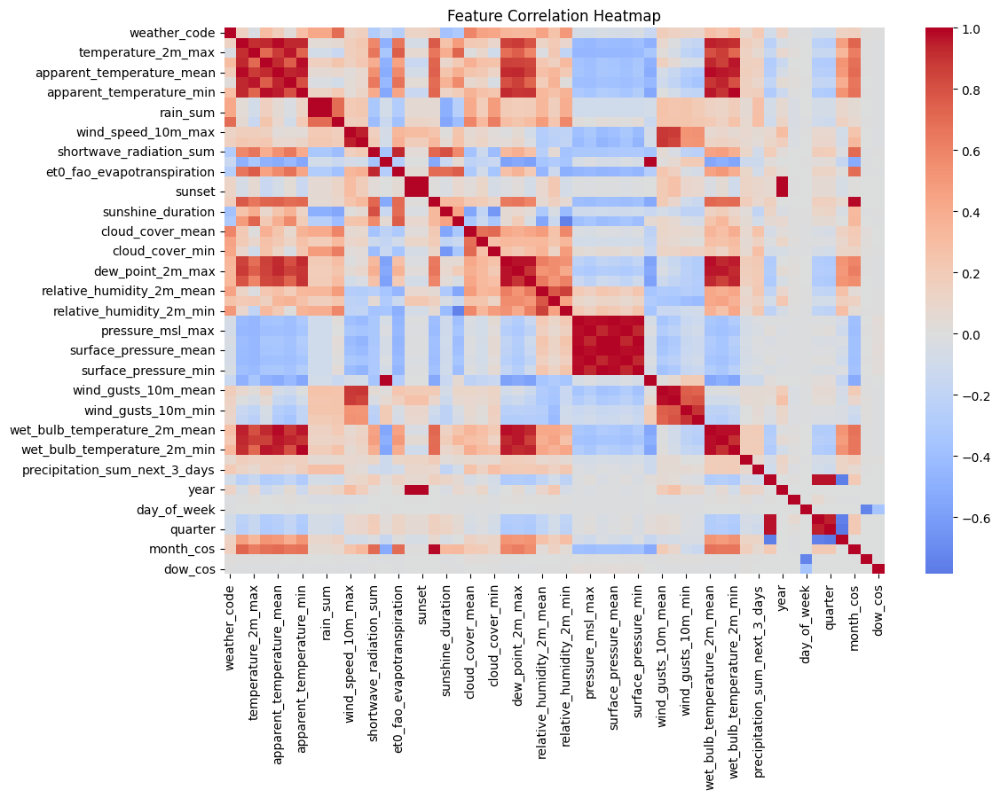

In [56]:
plt.figure(figsize=(12,8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap="coolwarm", center=0, annot=False)
plt.title("Feature Correlation Heatmap")
plt.show()

Distribution of target variable

KeyError: 'precipitation_next_3_days'

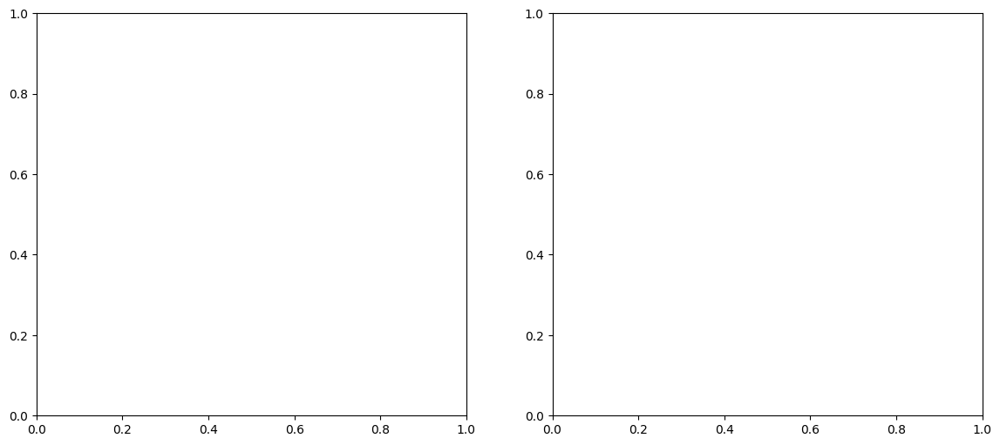

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Histogram + KDE
sns.histplot(df['precipitation_next_3_days'], bins=50, kde=True, ax=axes[0])
axes[0].set_title("Distribution of Precipitation (Next 3 Days)")
axes[0].set_xlabel("Precipitation (mm)")
axes[0].set_ylabel("Count")

# Boxplot
sns.boxplot(x=df['precipitation_next_3_days'], ax=axes[1])
axes[1].set_title("Boxplot of Precipitation (Next 3 Days)")
axes[1].set_xlabel("Precipitation (mm)")

plt.tight_layout()
plt.show()

Target variable against all other numerical columns

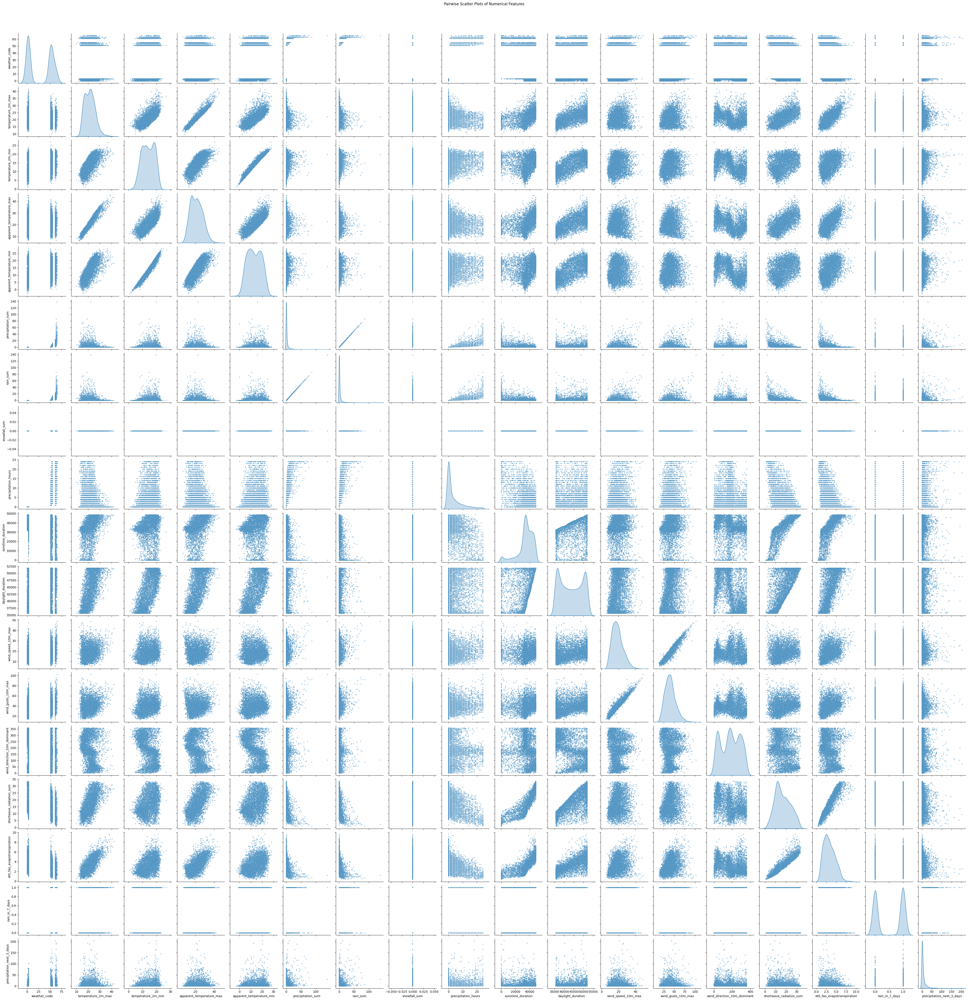

In [35]:
# Select only numeric features
num_df = df.select_dtypes(include=['float64', 'int64'])

# Pairplot
sns.pairplot(num_df, diag_kind='kde', plot_kws={'s': 10, 'alpha': 0.5})
plt.suptitle("Pairwise Scatter Plots of Numerical Features", y=1.02)
plt.show()

Convert sunrise and sunset to minutes after midnight

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4745 entries, 0 to 4744
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   time                         4745 non-null   object        
 1   weather_code                 4745 non-null   int64         
 2   temperature_2m_max           4745 non-null   float64       
 3   temperature_2m_min           4745 non-null   float64       
 4   apparent_temperature_max     4745 non-null   float64       
 5   apparent_temperature_min     4745 non-null   float64       
 6   precipitation_sum            4745 non-null   float64       
 7   rain_sum                     4745 non-null   float64       
 8   snowfall_sum                 4745 non-null   float64       
 9   precipitation_hours          4745 non-null   float64       
 10  sunrise                      4745 non-null   datetime64[ns]
 11  sunset                       4745 non-null 

In [88]:
df['sunrise_minutes'].value_counts()

sunrise_minutes
420    206
277    188
419    101
278     92
418     73
      ... 
312     22
330     22
337     22
317     22
421     21
Name: count, Length: 145, dtype: int64

In [127]:
# Convert to datetime
df['sunrise'] = pd.to_datetime(df['sunrise'])
df['sunset'] = pd.to_datetime(df['sunset'])

# Extract minutes since midnight
df['sunrise_minutes'] = df['sunrise'].dt.hour * 60 + df['sunrise'].dt.minute
df['sunset_minutes'] = df['sunset'].dt.hour * 60 + df['sunset'].dt.minute

df['sunrise_minutes'] = pd.to_numeric(df['sunrise_minutes'])
df['sunset_minutes'] = pd.to_numeric(df['sunset_minutes'])

df['sunrise_minutes'] = df['sunrise_minutes'].astype('int64')
df['sunset_minutes'] = df['sunset_minutes'].astype('int64')

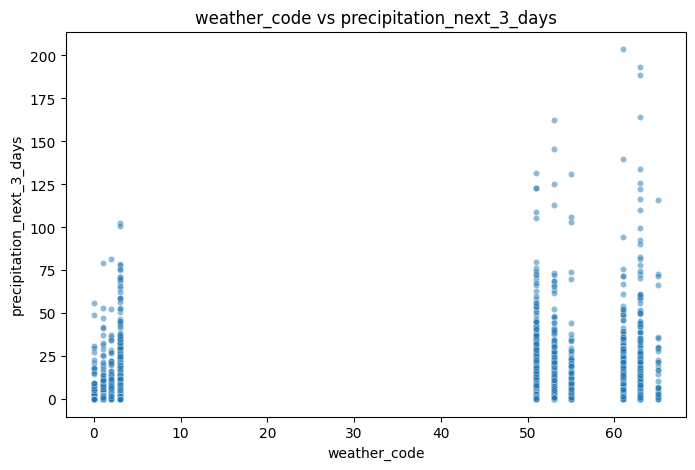

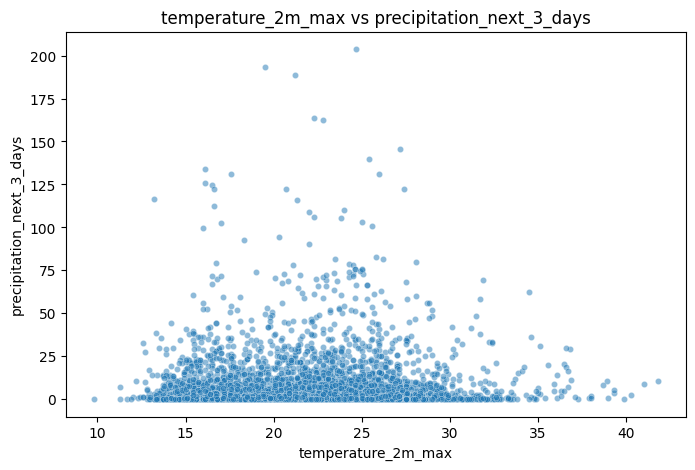

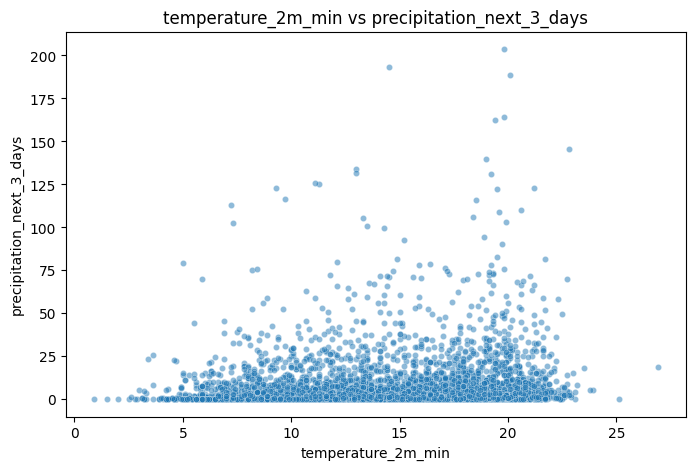

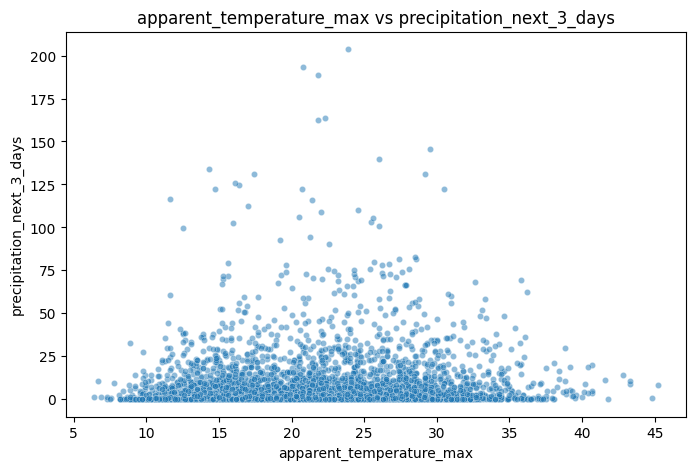

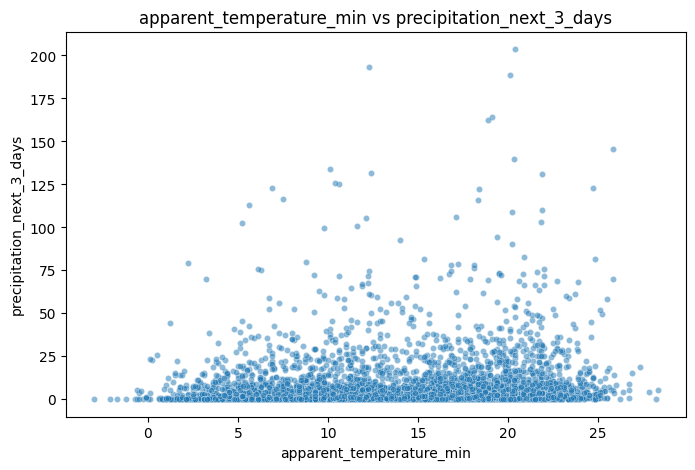

...

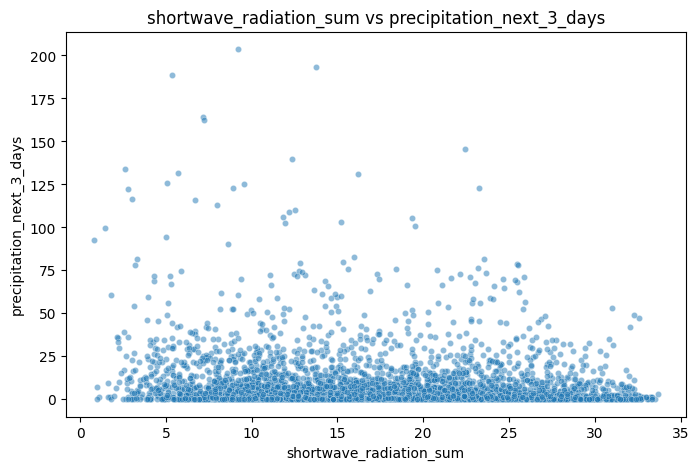

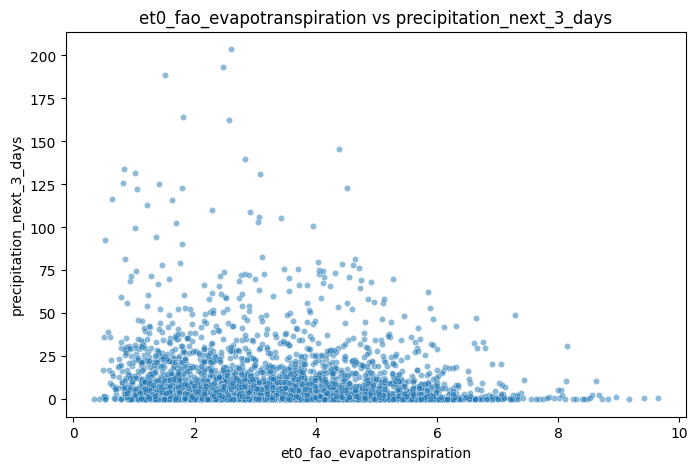

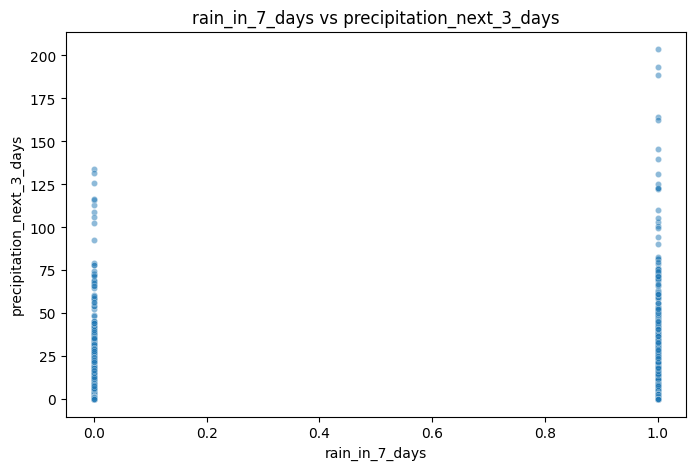

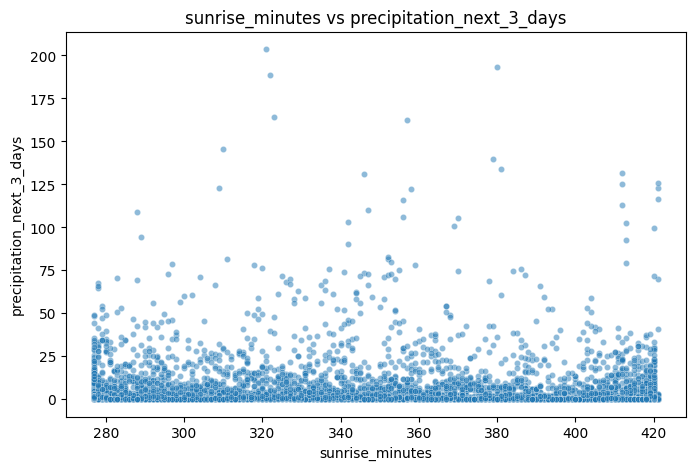

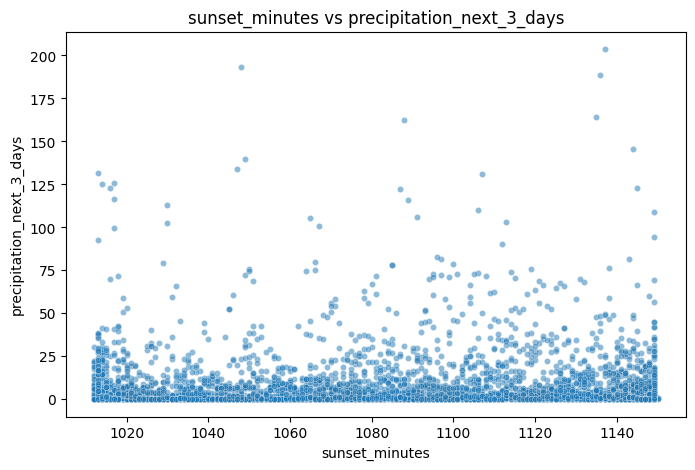

In [90]:

target = 'precipitation_next_3_days'
num_df = df.select_dtypes(include=['float64', 'int64'])

for col in num_df.columns:
    if col != target:  # skip the target itself
        plt.figure(figsize=(8, 5))
        sns.scatterplot(x=df[col], y=df[target], alpha=0.5, s=20)
        plt.title(f"{col} vs {target}")
        plt.xlabel(col)
        plt.ylabel(target)
        plt.show()

In [93]:
corr = df.corr(numeric_only=True)['precipitation_next_3_days'].sort_values(ascending=False)
print(corr)

precipitation_next_3_days      1.000000
precipitation_hours            0.293306
precipitation_sum              0.291547
rain_sum                       0.291547
weather_code                   0.207356
apparent_temperature_min       0.153312
temperature_2m_min             0.150127
apparent_temperature_max       0.090449
sunset_minutes                 0.085364
rain_in_7_days                 0.078338
daylight_duration              0.071498
temperature_2m_max             0.061122
wind_speed_10m_max             0.056256
wind_gusts_10m_max             0.039635
sunrise_minutes               -0.055842
et0_fao_evapotranspiration    -0.089965
shortwave_radiation_sum       -0.100379
wind_direction_10m_dominant   -0.116868
sunshine_duration             -0.206141
snowfall_sum                        NaN
Name: precipitation_next_3_days, dtype: float64


After feature engineering, drop columns which are no longer needed

In [57]:
df.columns

Index(['time', 'weather_code', 'temperature_2m_max', 'temperature_2m_min',
       'apparent_temperature_max', 'apparent_temperature_min',
       'precipitation_sum', 'rain_sum', 'snowfall_sum', 'precipitation_hours',
       'sunrise', 'sunset', 'sunshine_duration', 'daylight_duration',
       'wind_speed_10m_max', 'wind_gusts_10m_max',
       'wind_direction_10m_dominant', 'shortwave_radiation_sum',
       'et0_fao_evapotranspiration', 'rain_in_7_days',
       'precipitation_next_3_days', 'sunrise_minutes', 'sunset_minutes',
       'weather_desc'],
      dtype='object')

In [128]:
df_clean = df.copy()
df_clean.drop(columns=['sunrise','sunset', 'snowfall_sum', 'weather_code', 'rain_in_7_days'], axis=1)

,time,temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,precipitation_hours,sunshine_duration,daylight_duration,wind_speed_10m_max,wind_gusts_10m_max,wind_direction_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration,precipitation_next_3_days,weather_desc,sunrise_minutes,sunset_minutes
0,2010-01-01,25.7,21.1,26.7,24.2,3.9,3.9,12.0,11820.64,51690.04,18.6,35.6,332,10.13,2.46,10.3,Drizzle,287,1149
1,2010-01-02,26.9,21.0,32.6,22.2,8.6,8.6,14.0,47009.17,51656.75,15.6,37.4,299,23.62,4.57,1.7,Rain,288,1149
2,2010-01-03,20.6,19.5,21.3,19.2,1.1,1.1,7.0,0.00,51620.64,18.3,37.4,147,6.71,2.14,0.6,Light Drizzle,289,1149
3,2010-01-04,22.5,19.2,22.3,19.5,0.6,0.6,4.0,33312.08,51581.75,16.9,37.4,70,15.84,3.50,0.0,Light Drizzle,290,1149
4,2010-01-05,26.0,18.6,30.0,19.8,0.0,0.0,0.0,48326.60,51540.10,17.5,39.2,35,30.14,5.62,0.5,Cloudy,290,1149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4740,2022-12-24,29.0,15.1,34.0,16.3,0.0,0.0,0.0,48614.68,51852.80,18.7,39.2,52,29.12,5.74,0.0,Cloudy,282,1146
4741,2022-12-25,25.5,17.8,29.7,18.6,0.0,0.0,0.0,48607.28,51844.99,19.5,37.8,112,30.15,5.28,0.0,Cloudy,283,1147
4742,2022-12-26,27.5,15.9,31.0,17.2,0.0,0.0,0.0,47998.38,51834.03,21.8,45.0,41,31.49,5.89,0.3,Cloudy,283,1147
4743,2022-12-27,26.5,15.6,29.2,16.6,0.0,0.0,0.0,48583.77,51819.93,19.3,40.7,49,32.17,5.71,6.2,Partly Cloudy,284,1147


In [131]:
# onehot encode 
from sklearn.preprocessing import OneHotEncoder

# Rename for Prophet
df_prophet = df_clean.rename(columns={"time": "ds", "precipitation_next_3_days": "y"})

# Parse datetime
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Encode weather_desc (one-hot or target encoding)
df_prophet = pd.get_dummies(df_prophet, columns=["weather_desc"], drop_first=True)



# Train: all years before 2024
train_df = df_prophet[df_prophet['ds'].dt.year < 2024].copy()

# Test: year 2024
test_df = df_prophet[df_prophet['ds'].dt.year >= 2024].copy()

# Separate regressors from target
target = 'y'

# Regressors = all columns except 'ds' and 'y'
regressors = [col for col in df_prophet.columns if col not in ['ds', 'y']]

In [132]:
test_df

,ds,weather_code,temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,...,sunset_minutes,weather_desc_Drizzle,weather_desc_Heavy Drizzle,weather_desc_Heavy Rain,weather_desc_Light Drizzle,weather_desc_Light Rain,weather_desc_Mainly Sunny,weather_desc_Partly Cloudy,weather_desc_Rain,weather_desc_Sunny


In [133]:
train_df['ds']

0      2010-01-01
1      2010-01-02
2      2010-01-03
3      2010-01-04
4      2010-01-05
          ...    
4740   2022-12-24
4741   2022-12-25
4742   2022-12-26
4743   2022-12-27
4744   2022-12-28
Name: ds, Length: 4745, dtype: datetime64[ns]

In [117]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

initial_window = 1000  # number of days in initial train fold
horizon = 1            # predict one row at a time (each row is already 3-day sum)
step = 30              # move forward 30 days per fold

cv_rmse = []
cv_mae = []

for start in range(0, len(train_df) - initial_window - horizon + 1, step):
    # Split current fold
    cv_train = train_df.iloc[start:start+initial_window]
    cv_val = train_df.iloc[start+initial_window:start+initial_window+horizon]

    # Initialize Prophet
    model = Prophet()
    for reg in regressors:
        model.add_regressor(reg)

    # Fit model
    model.fit(cv_train)

    # Prepare validation dataframe
    future = cv_val[['ds'] + regressors]

    # Predict
    forecast = model.predict(future)
    y_pred = forecast['yhat'].values
    y_true = cv_val['y'].values

    # Metrics
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mae = mean_absolute_error(y_true, y_pred)

    cv_rmse.append(rmse)
    cv_mae.append(mae)

    print(f"Fold starting at {cv_train['ds'].iloc[0].date()} -> RMSE: {rmse:.3f}, MAE: {mae:.3f}")

print(f"\nAverage CV RMSE: {np.mean(cv_rmse):.3f}")
print(f"Average CV MAE: {np.mean(cv_mae):.3f}")

21:13:19 - cmdstanpy - INFO - Chain [1] start processing
21:13:19 - cmdstanpy - INFO - Chain [1] done processing
21:13:19 - cmdstanpy - INFO - Chain [1] start processing
21:13:19 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-01-01 -> RMSE: 0.008, MAE: 0.008
Fold starting at 2010-01-31 -> RMSE: 3.765, MAE: 3.765


21:13:19 - cmdstanpy - INFO - Chain [1] start processing
21:13:19 - cmdstanpy - INFO - Chain [1] done processing
21:13:19 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-03-02 -> RMSE: 2.966, MAE: 2.966
Fold starting at 2010-04-01 -> RMSE: 4.549, MAE: 4.549


21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing
21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-05-01 -> RMSE: 115.785, MAE: 115.785
Fold starting at 2010-05-31 -> RMSE: 14.683, MAE: 14.683


21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing
21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-06-30 -> RMSE: 3.422, MAE: 3.422
Fold starting at 2010-07-30 -> RMSE: 0.392, MAE: 0.392


21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing
21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:20 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-08-29 -> RMSE: 10.366, MAE: 10.366
Fold starting at 2010-09-28 -> RMSE: 5.809, MAE: 5.809


21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-10-28 -> RMSE: 0.667, MAE: 0.667
Fold starting at 2010-11-27 -> RMSE: 2.596, MAE: 2.596


21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2010-12-27 -> RMSE: 3.839, MAE: 3.839
Fold starting at 2011-01-26 -> RMSE: 1.254, MAE: 1.254


21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-02-25 -> RMSE: 10.303, MAE: 10.303
Fold starting at 2011-03-27 -> RMSE: 3.938, MAE: 3.938


21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-04-26 -> RMSE: 11.819, MAE: 11.819
Fold starting at 2011-05-26 -> RMSE: 13.063, MAE: 13.063


21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-06-25 -> RMSE: 14.372, MAE: 14.372
Fold starting at 2011-07-25 -> RMSE: 0.371, MAE: 0.371


21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-08-24 -> RMSE: 7.969, MAE: 7.969
Fold starting at 2011-09-23 -> RMSE: 3.212, MAE: 3.212


21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-10-23 -> RMSE: 4.787, MAE: 4.787
Fold starting at 2011-11-22 -> RMSE: 0.499, MAE: 0.499


21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing
21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2011-12-22 -> RMSE: 0.229, MAE: 0.229
Fold starting at 2012-01-21 -> RMSE: 3.922, MAE: 3.922


21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing
21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-02-20 -> RMSE: 12.274, MAE: 12.274
Fold starting at 2012-03-21 -> RMSE: 3.616, MAE: 3.616


21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing
21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-04-20 -> RMSE: 11.482, MAE: 11.482
Fold starting at 2012-05-20 -> RMSE: 13.089, MAE: 13.089


21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-06-19 -> RMSE: 6.023, MAE: 6.023
Fold starting at 2012-07-19 -> RMSE: 0.445, MAE: 0.445


21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-08-18 -> RMSE: 5.343, MAE: 5.343
Fold starting at 2012-09-17 -> RMSE: 16.912, MAE: 16.912


21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-10-17 -> RMSE: 14.359, MAE: 14.359
Fold starting at 2012-11-16 -> RMSE: 5.613, MAE: 5.613


21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:24 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2012-12-16 -> RMSE: 3.704, MAE: 3.704
Fold starting at 2013-01-15 -> RMSE: 9.851, MAE: 9.851


21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2013-02-14 -> RMSE: 3.337, MAE: 3.337
Fold starting at 2013-03-16 -> RMSE: 1.766, MAE: 1.766


21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2013-04-15 -> RMSE: 9.642, MAE: 9.642
Fold starting at 2013-05-15 -> RMSE: 5.741, MAE: 5.741


21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2013-06-14 -> RMSE: 5.973, MAE: 5.973
Fold starting at 2013-07-14 -> RMSE: 8.933, MAE: 8.933


21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing
21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2013-08-13 -> RMSE: 9.700, MAE: 9.700
Fold starting at 2013-09-12 -> RMSE: 1.381, MAE: 1.381


21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing
21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2013-10-12 -> RMSE: 25.564, MAE: 25.564


21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing
21:13:26 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2013-11-11 -> RMSE: 6.798, MAE: 6.798
Fold starting at 2013-12-11 -> RMSE: 3.494, MAE: 3.494


21:13:26 - cmdstanpy - INFO - Chain [1] done processing
21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing
21:13:27 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2014-01-10 -> RMSE: 1.179, MAE: 1.179
Fold starting at 2014-02-09 -> RMSE: 3.721, MAE: 3.721


21:13:27 - cmdstanpy - INFO - Chain [1] done processing
21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2014-03-11 -> RMSE: 4.095, MAE: 4.095


21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2014-04-10 -> RMSE: 6.149, MAE: 6.149
Fold starting at 2014-05-10 -> RMSE: 6.916, MAE: 6.916


21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing
21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2014-06-09 -> RMSE: 5.948, MAE: 5.948
Fold starting at 2014-07-09 -> RMSE: 19.608, MAE: 19.608


21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2014-08-08 -> RMSE: 1.011, MAE: 1.011
Fold starting at 2014-09-07 -> RMSE: 8.696, MAE: 8.696


21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:28 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2014-10-07 -> RMSE: 10.483, MAE: 10.483
Fold starting at 2014-11-06 -> RMSE: 10.486, MAE: 10.486


21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2014-12-06 -> RMSE: 0.380, MAE: 0.380
Fold starting at 2015-01-05 -> RMSE: 0.302, MAE: 0.302


21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2015-02-04 -> RMSE: 1.467, MAE: 1.467
Fold starting at 2015-03-06 -> RMSE: 13.564, MAE: 13.564


21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2015-04-05 -> RMSE: 9.282, MAE: 9.282
Fold starting at 2015-05-05 -> RMSE: 0.415, MAE: 0.415


21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2015-06-04 -> RMSE: 10.907, MAE: 10.907
Fold starting at 2015-07-04 -> RMSE: 6.636, MAE: 6.636


21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2015-08-03 -> RMSE: 6.041, MAE: 6.041
Fold starting at 2015-09-02 -> RMSE: 9.911, MAE: 9.911


21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing
21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2015-10-02 -> RMSE: 8.079, MAE: 8.079
Fold starting at 2015-11-01 -> RMSE: 2.773, MAE: 2.773


21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing
21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2015-12-01 -> RMSE: 1.589, MAE: 1.589
Fold starting at 2015-12-31 -> RMSE: 0.596, MAE: 0.596


21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1] done processing
21:13:30 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-01-30 -> RMSE: 0.989, MAE: 0.989


21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-02-29 -> RMSE: 62.664, MAE: 62.664
Fold starting at 2016-03-30 -> RMSE: 5.186, MAE: 5.186


21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing
21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-04-29 -> RMSE: 0.083, MAE: 0.083
Fold starting at 2016-05-29 -> RMSE: 11.516, MAE: 11.516


21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing
21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-06-28 -> RMSE: 13.247, MAE: 13.247
Fold starting at 2016-07-28 -> RMSE: 5.576, MAE: 5.576


21:13:31 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing
21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-08-27 -> RMSE: 2.626, MAE: 2.626
Fold starting at 2016-09-26 -> RMSE: 6.971, MAE: 6.971


21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing
21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-10-26 -> RMSE: 1.485, MAE: 1.485
Fold starting at 2016-11-25 -> RMSE: 7.551, MAE: 7.551


21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing
21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2016-12-25 -> RMSE: 5.401, MAE: 5.401
Fold starting at 2017-01-24 -> RMSE: 6.707, MAE: 6.707


21:13:32 - cmdstanpy - INFO - Chain [1] start processing
21:13:32 - cmdstanpy - INFO - Chain [1] done processing
21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2017-02-23 -> RMSE: 2.325, MAE: 2.325
Fold starting at 2017-03-25 -> RMSE: 1.008, MAE: 1.008


21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing
21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2017-04-24 -> RMSE: 5.674, MAE: 5.674
Fold starting at 2017-05-24 -> RMSE: 10.913, MAE: 10.913


21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing
21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:33 - cmdstanpy - INFO - Chain [1] done processing
21:13:33 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2017-06-23 -> RMSE: 12.638, MAE: 12.638
Fold starting at 2017-07-23 -> RMSE: 2.373, MAE: 2.373


21:13:33 - cmdstanpy - INFO - Chain [1] done processing
21:13:33 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2017-08-22 -> RMSE: 18.218, MAE: 18.218
Fold starting at 2017-09-21 -> RMSE: 4.600, MAE: 4.600


21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2017-10-21 -> RMSE: 8.298, MAE: 8.298
Fold starting at 2017-11-20 -> RMSE: 3.341, MAE: 3.341


21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2017-12-20 -> RMSE: 9.993, MAE: 9.993
Fold starting at 2018-01-19 -> RMSE: 5.195, MAE: 5.195


21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2018-02-18 -> RMSE: 6.806, MAE: 6.806
Fold starting at 2018-03-20 -> RMSE: 8.644, MAE: 8.644


21:13:35 - cmdstanpy - INFO - Chain [1] done processing
21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2018-04-19 -> RMSE: 4.762, MAE: 4.762
Fold starting at 2018-05-19 -> RMSE: 4.533, MAE: 4.533


21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing
21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing
21:13:35 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2018-06-18 -> RMSE: 21.098, MAE: 21.098
Fold starting at 2018-07-18 -> RMSE: 0.176, MAE: 0.176


21:13:35 - cmdstanpy - INFO - Chain [1] done processing
21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2018-08-17 -> RMSE: 7.917, MAE: 7.917
Fold starting at 2018-09-16 -> RMSE: 1.384, MAE: 1.384


21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:35 - cmdstanpy - INFO - Chain [1] done processing
21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2018-10-16 -> RMSE: 4.006, MAE: 4.006
Fold starting at 2018-11-15 -> RMSE: 1.805, MAE: 1.805


21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing
21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2018-12-15 -> RMSE: 8.800, MAE: 8.800
Fold starting at 2019-01-14 -> RMSE: 10.326, MAE: 10.326


21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing
21:13:36 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing
21:13:36 - cmdstanpy - INFO - Chain [1] start processing


Fold starting at 2019-02-13 -> RMSE: 23.989, MAE: 23.989
Fold starting at 2019-03-15 -> RMSE: 0.491, MAE: 0.491


21:13:36 - cmdstanpy - INFO - Chain [1] done processing
21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-04-14 -> RMSE: 5.819, MAE: 5.819


21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-05-14 -> RMSE: 15.811, MAE: 15.811
Fold starting at 2019-06-13 -> RMSE: 22.725, MAE: 22.725


21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing
21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-07-13 -> RMSE: 10.770, MAE: 10.770
Fold starting at 2019-08-12 -> RMSE: 25.990, MAE: 25.990


21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing
21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-09-11 -> RMSE: 4.276, MAE: 4.276


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-10-11 -> RMSE: 12.514, MAE: 12.514


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2019-11-10 -> RMSE: 3.834, MAE: 3.834
Fold starting at 2019-12-10 -> RMSE: 1.512, MAE: 1.512


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing
21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2020-01-09 -> RMSE: 36.720, MAE: 36.720
Fold starting at 2020-02-08 -> RMSE: 9.229, MAE: 9.229


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing


Fold starting at 2020-03-09 -> RMSE: 1.085, MAE: 1.085

Average CV RMSE: 8.396
Average CV MAE: 8.396


In [118]:
final_model = Prophet()

for reg in regressors:
    final_model.add_regressor(reg)

final_model.fit(train_df)

# Predict on test set
future_test = test_df[['ds'] + regressors]
forecast_test = final_model.predict(future_test)

y_test_pred = forecast_test['yhat'].values
y_test_true = test_df['y'].values

test_rmse = mean_squared_error(y_test_true, y_test_pred, squared=False)
test_mae = mean_absolute_error(y_test_true, y_test_pred)

print(f"\nTest RMSE: {test_rmse:.3f}, Test MAE: {test_mae:.3f}")

# Optional: visualize predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))
plt.plot(test_df['ds'], y_test_true, label='True', marker='o', ms=3)
plt.plot(test_df['ds'], y_test_pred, label='Predicted', marker='x', ms=3)
plt.title("Prophet Predictions vs True (3-Day Precipitation Sum)")
plt.xlabel("Date")
plt.ylabel("Precipitation (mm)")
plt.legend()
plt.show()

21:15:29 - cmdstanpy - INFO - Chain [1] start processing
21:15:30 - cmdstanpy - INFO - Chain [1] done processing


ValueError: Dataframe has no rows.

In [120]:
print(test_df.shape)
print(test_df['ds'].min(), test_df['ds'].max())

(0, 32)
NaT NaT
